## Honey Bee Frame Image Captioner Prototype
### Elizabeth Trahadias, CS 733 Final Project

This notebook puts our entire architecture together. Since some of the models took a long time to train, this notebook calls the saved version of all of the best models for each step.


As a reminder, data flows through the model in the following way: 
1. An image is classified by a CNN as healthy or unhealthy.
    1. If the image is healthy, this is advised to the user.
    2. If the image is unhealthy, the image goes to the next step.
2. The unhealthy image is classified by another CNN that predicts which disease the image may have.
3. The unhealthy image goes through the image captioning model, and a descriptive caption is created for the image.

Note: this notebook does not contain the text-to-speech part. If you would like to see the demo with the text-to-speech, please see my Google Colab notebook.

### Create Functions

In [2]:
# Load libraries/packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xml.etree.ElementTree as ET
import urllib.request
import os
import csv
import json
import requests
import time
from requests import exceptions
import cv2
import argparse
from pathlib import Path
from PIL import Image
import re

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.layers import Input, Flatten, Dense
from tensorflow.keras.models import Model

import spacy
from unicodedata import normalize

from transformers import AutoTokenizer, TFAutoModelForSequenceClassification
from transformers import ViTFeatureExtractor
from transformers import VisionEncoderDecoderModel
from transformers import pipeline 

In [4]:
! pip install session-info

In [7]:
import session_info
session_info.show()

First, we load our best CNN model to classify the image as unhealthy or healthy.

In [2]:
# Load in the CNN that detects as healthy or unhealthy
model = tf.keras.models.load_model('cnn_healthy_vs_unhealthy_final.h5')

Metal device set to: Apple M1 Pro


2022-12-18 13:40:24.854955: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-18 13:40:24.855081: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Next, we load in our CNN model that classifies the type of disease if the image is unhealthy.

In [3]:
# Load in pre-trained model that detects type of disease
model2 = tf.keras.models.load_model('best_unhealthy_cnn_final_version.h5')
# 'best_unhealthy_cnn_final.h5'

In the function below, we load in the image, make the prediction, and then output if the image is healthy or not.

In [4]:
# Run the CNN that predicts as healthy or unhealthy
def HealthyOrUnhealthy(image_path):
        img = tf.keras.utils.load_img(image_path, target_size=(224, 224))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch
        
        # Use model
        y_prob = model.predict(img_array)
        y_prob_healthy = 1-y_prob
        
        if y_prob >= 0.5:
            y_pred = 1
        else:
            y_pred = 0 
            
        if y_pred == 0:
            output = "This image is most likely HEALTHY with a {} probability.".format(y_prob_healthy,2)
            return(output, plt.imshow(img))
        else:
            output="This image is most likely UNHEALTHY with a {} probability.".format(y_prob,2)
            return(output, img)

If the image is unhealthy, the type of disease will be predicted using the model below. The abbreviated name of the disease will be outputed along with the probability of the image belonging to that class.

In [5]:
# Run the CNN that predicts the disease
def TypeOfDisease(image_path, img):
        img = tf.keras.utils.load_img(image_path, target_size=(224, 224))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0) # Create a batch
        # Use model2
        predictions = model2.predict(img_array)
        score = tf.nn.softmax(predictions[0])
        
        class_names = ['afb', 'chalkbrood', 'efb', 'pms', 'sacbrood']
        
        return("This image is likely diseased and may have {} with a {:.2f} percent confidence."
              .format(class_names[np.argmax(score)], 100 * np.max(score)), plt.imshow(img))

In the `ProduceCaption` function, we will use Hugging Face's `pipeline()` function to call our pre-trained image captioning model. This model returns the caption for the image.

In [6]:
# Use pre-trained Vision Encoder Decoder model to extract feature images
# and generate caption from tokens
def ProduceCaption(image_path):
    # Use pre-trained ViT
    image_captioner = pipeline("image-to-text", model='vit-scibert-final')
    return(image_captioner(image_path))

The `Captioner` function puts all of the functions together to call in one easy step.

In [7]:
# Run the whole architecture and generate the predictions and/or captions
def Captioner(image_path):
    output, img = HealthyOrUnhealthy(image_path)
        
    if output.split()[5] == "UNHEALTHY":
        return(TypeOfDisease(image_path, img), ProduceCaption(image_path))
    else:
        return(output)

### Test Our Arhitecture and Model

#### Predicting on Unhealthy Images

1/1 [==============================] - 0s 163ms/step


2022-12-18 13:40:25.546184: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-12-18 13:40:25.606819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 81ms/step


2022-12-18 13:40:25.766570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']
/opt/miniconda3/envs/pt_tf/lib/python3.9/site-packages/transformers/generation_utils.py:1359: UserWarning: Neither `max_length` nor `max_new_tokens` has been set, `max_length` will default to 20 (`self.config.max_length`). Controlling `max_length` via the config is deprecated and `max_length` will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


(('This image is likely diseased and may have efb with a 23.58 percent confidence.',
  <matplotlib.image.AxesImage at 0x29b7a93d0>),
 [{'generated_text': 'collection white larva gondola shape near cap brood'}])

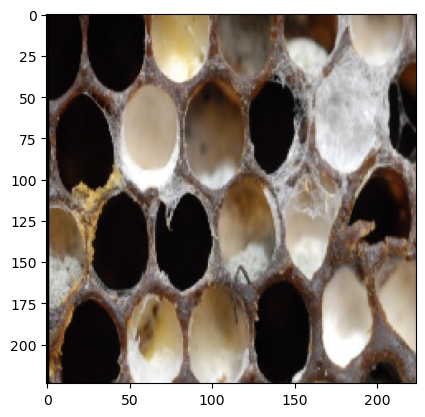

In [8]:
Captioner('my_bee_pics/test/stonebrood.jpeg')

This is a diseased frame (stonebrood - model not trained on this disease). The caption is relatively accurate, as this disease is similar to chalkbrood.

1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 29.23 percent confidence.',
  <matplotlib.image.AxesImage at 0x2f79b38e0>),
 [{'generated_text': 'caramel color larva open brood cell'}])

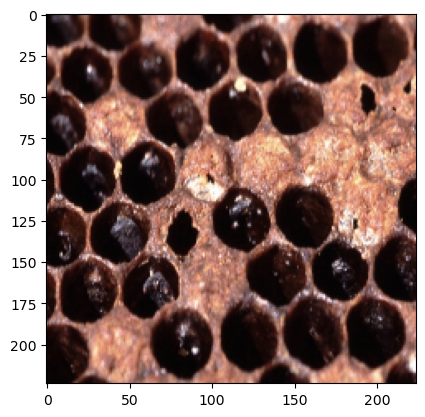

In [9]:
Captioner('my_bee_pics/test/afb.jpeg')

This is a frame with American Foulbrood (AFB). The caption is semi-accurate. I wish it would have identified the holes in the cappings.

1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 29.47 percent confidence.',
  <matplotlib.image.AxesImage at 0x2f7a998e0>),
 [{'generated_text': 'visible larva gondola shape near cap brood cell'}])

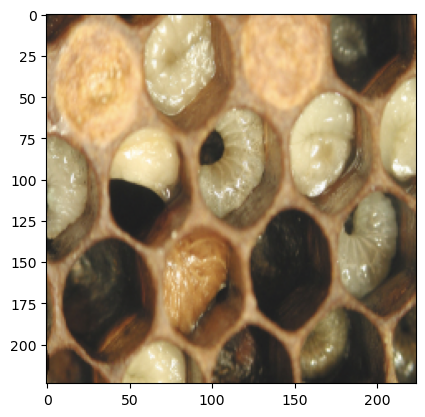

In [10]:
Captioner('my_bee_pics/test/efb.jpeg')

This is European Foulbrood. This image caption is not as accurate; we would expect this description for something like chalkbrood; however, it did pick up on the white larva in the open cells... just not the discolored and yellow larva.

Let's try looping through all of the unhealthy images in our test set to see how our model does.

In [11]:
test_images_unhealthy = pd.read_csv("BEES_TEST/Test_Captions_Final.txt", sep='\t')
image_paths_unhealthy = test_images_unhealthy['file'].values

1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']
/opt/miniconda3/envs/pt_tf/lib/python3.9/site-packages/transformers/generation_utils.py:1359: UserWarning: Neither `max_length` nor `max_new_tokens` has been set, `max_length` will default to 20 (`self.config.max_length`). Controlling `max_length` via the config is deprecated and `max_length` will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


(('This image is likely diseased and may have afb with a 31.28 percent confidence.', <matplotlib.image.AxesImage object at 0x28e6345b0>), [{'generated_text': 'hole capping chew larva'}])


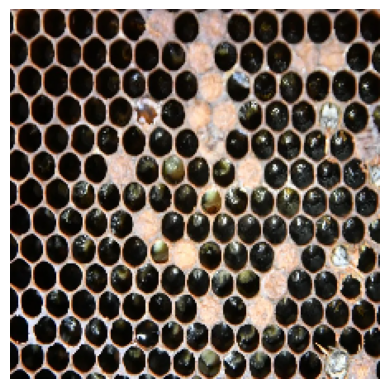

---------------------------------------------
1/1 [==============================] - 0s 8ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 33.79 percent confidence.', <matplotlib.image.AxesImage object at 0x2942fb400>), [{'generated_text': 'brown larva gondola shape'}])


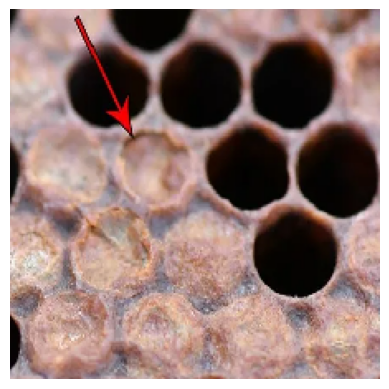

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 33.60 percent confidence.', <matplotlib.image.AxesImage object at 0x28e8caeb0>), [{'generated_text': 'collection white larva gondola shape'}])


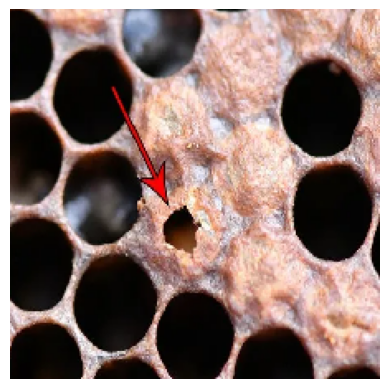

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 28.33 percent confidence.', <matplotlib.image.AxesImage object at 0x28e7664c0>), [{'generated_text': 'caramel color larva sink cell cap brood'}])


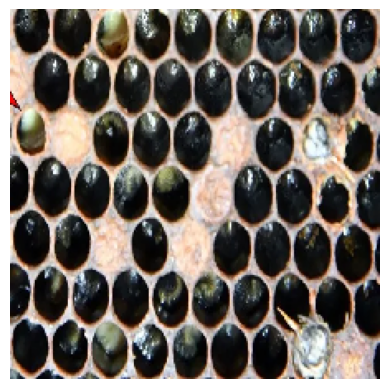

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 24.01 percent confidence.', <matplotlib.image.AxesImage object at 0x28e86b220>), [{'generated_text': 'combination cap brood cell'}])


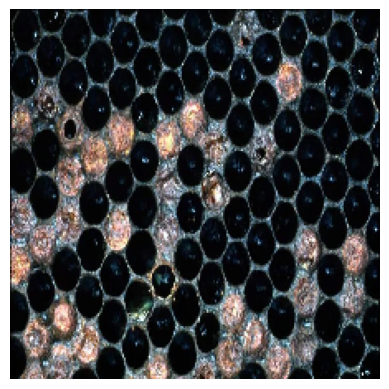

---------------------------------------------
1/1 [==============================] - 0s 11ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 22.91 percent confidence.', <matplotlib.image.AxesImage object at 0x28fe13a60>), [{'generated_text': 'spotty brood pattern capping discolored larva'}])


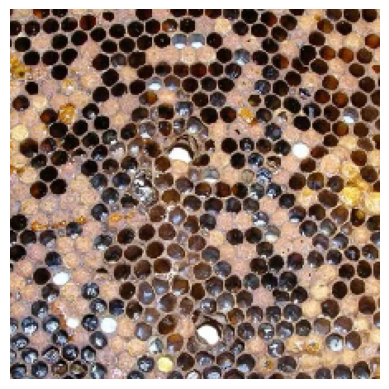

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 22.12 percent confidence.', <matplotlib.image.AxesImage object at 0x2dbba60a0>), [{'generated_text': 'visible larva deform open brood cell'}])


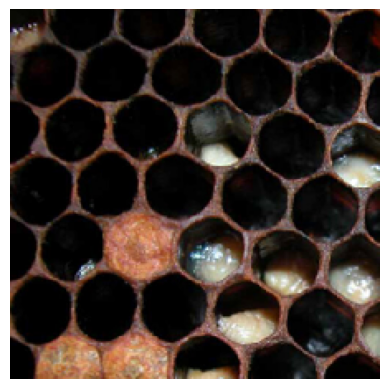

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 29.20 percent confidence.', <matplotlib.image.AxesImage object at 0x2dbbce6a0>), [{'generated_text': 'combination cap brood larva'}])


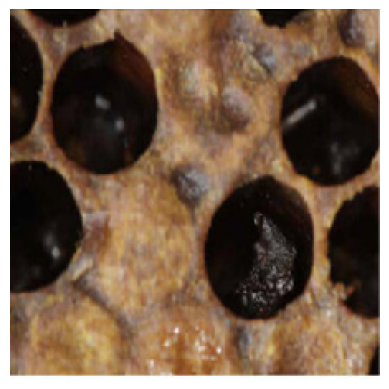

---------------------------------------------
1/1 [==============================] - 0s 13ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 24.66 percent confidence.', <matplotlib.image.AxesImage object at 0x28ff64d00>), [{'generated_text': 'combination cap brood discolor larva melt cell'}])


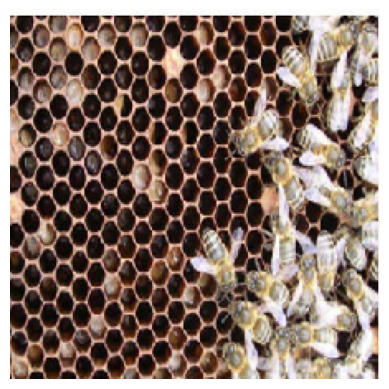

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 23.97 percent confidence.', <matplotlib.image.AxesImage object at 0x28fe6f310>), [{'generated_text': 'combination open brood larva sink cell'}])


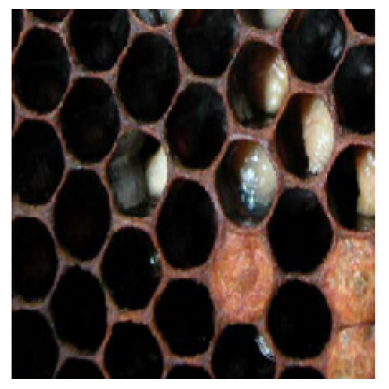

---------------------------------------------
1/1 [==============================] - 0s 11ms/step
This image is most likely HEALTHY with a [[0.65928173]] probability.


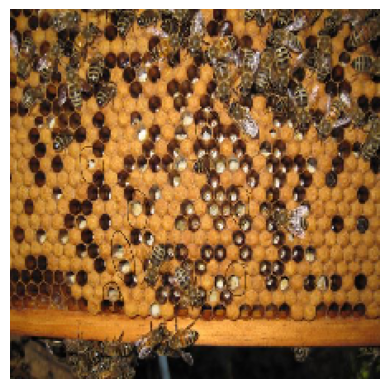

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 22.53 percent confidence.', <matplotlib.image.AxesImage object at 0x28e5c15b0>), [{'generated_text': 'single mummify larva see open brood cell'}])


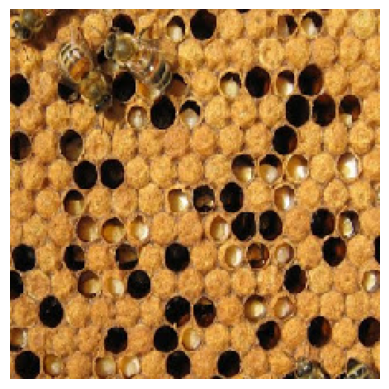

---------------------------------------------
1/1 [==============================] - 0s 11ms/step
This image is most likely HEALTHY with a [[0.736696]] probability.


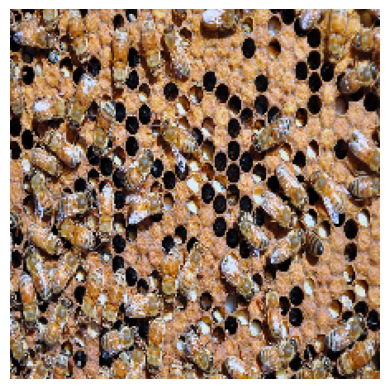

---------------------------------------------
1/1 [==============================] - 0s 11ms/step
This image is most likely HEALTHY with a [[0.7700344]] probability.


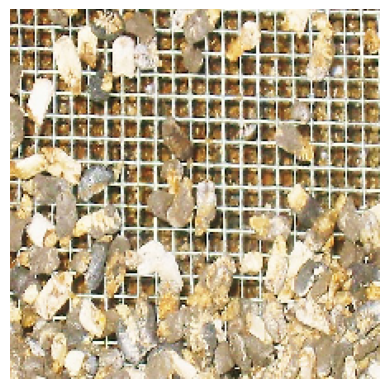

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 25.45 percent confidence.', <matplotlib.image.AxesImage object at 0x29008d580>), [{'generated_text': 'single mummify larva see open brood cell'}])


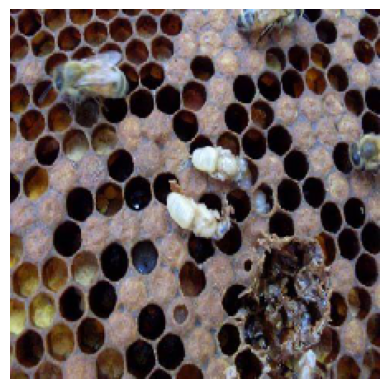

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 25.45 percent confidence.', <matplotlib.image.AxesImage object at 0x2dbebbb80>), [{'generated_text': 'collection white larva gondola shape'}])


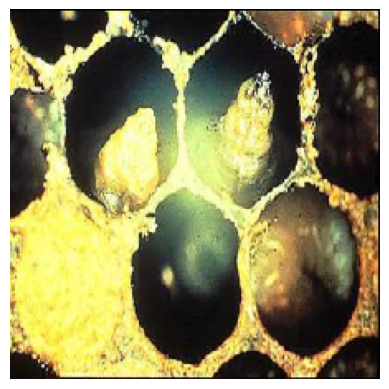

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 28.17 percent confidence.', <matplotlib.image.AxesImage object at 0x290149220>), [{'generated_text': 'caramel color larva damage open brood cell'}])


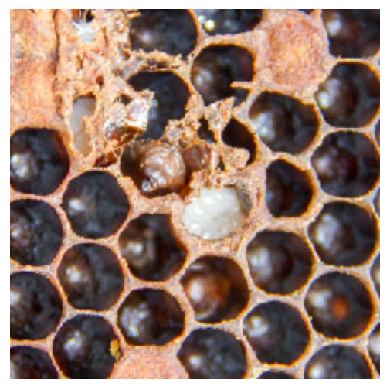

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 24.31 percent confidence.', <matplotlib.image.AxesImage object at 0x2900a47c0>), [{'generated_text': 'combination cap brood larva sink cell'}])


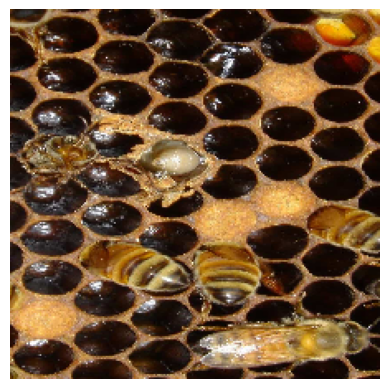

---------------------------------------------
1/1 [==============================] - 0s 8ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 32.32 percent confidence.', <matplotlib.image.AxesImage object at 0x28ff946a0>), [{'generated_text': 'combination cap brood larva sink cell'}])


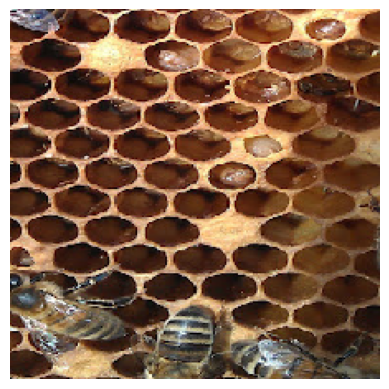

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 34.14 percent confidence.', <matplotlib.image.AxesImage object at 0x28e817220>), [{'generated_text': 'combination cap brood larva sink cell'}])


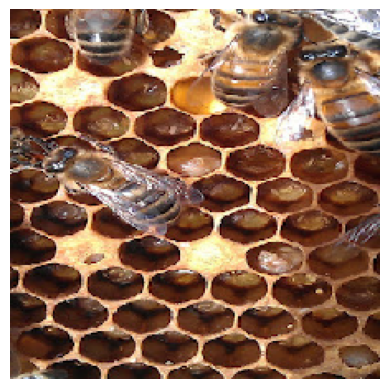

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 26.40 percent confidence.', <matplotlib.image.AxesImage object at 0x28e891760>), [{'generated_text': 'combination cap brood larva sink cell'}])


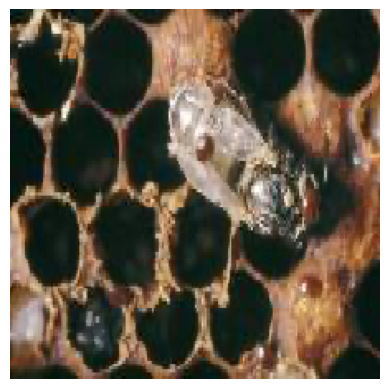

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 25.80 percent confidence.', <matplotlib.image.AxesImage object at 0x28e81cfa0>), [{'generated_text': 'caramel color larva open brood cell'}])


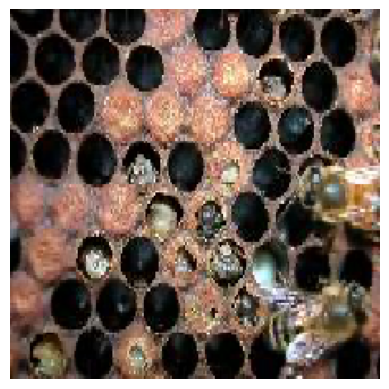

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 32.32 percent confidence.', <matplotlib.image.AxesImage object at 0x28e7993a0>), [{'generated_text': 'hole capping drone larvae infect'}])


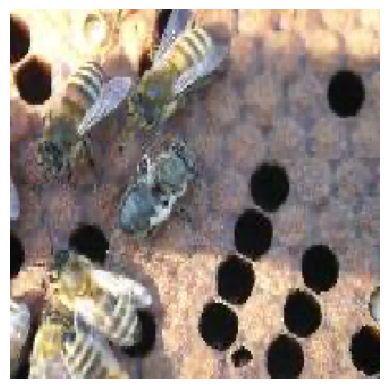

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.5343865]] probability.


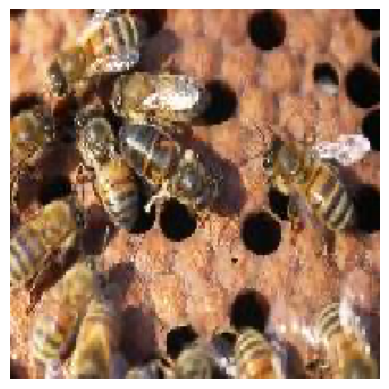

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have efb with a 22.45 percent confidence.', <matplotlib.image.AxesImage object at 0x2f798b250>), [{'generated_text': 'spotty brood pattern capping larva'}])


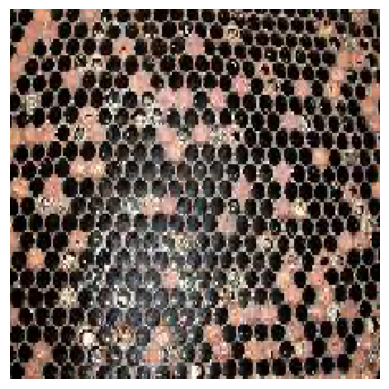

---------------------------------------------


In [12]:
for image in image_paths_unhealthy:
    print(Captioner(image))
    plt.axis("off")
    plt.show()
    print("---------------------------------------------")

#### Predicting on Healthy Images from the Test Set

1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.8686566]] probability.


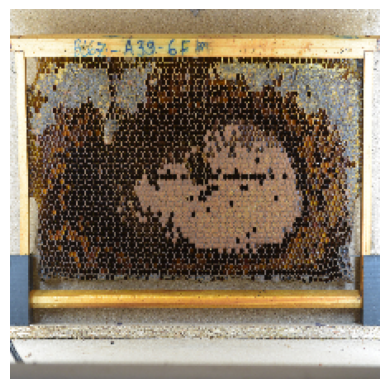

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.8526836]] probability.


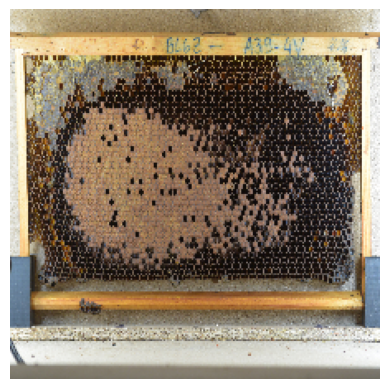

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.7909387]] probability.


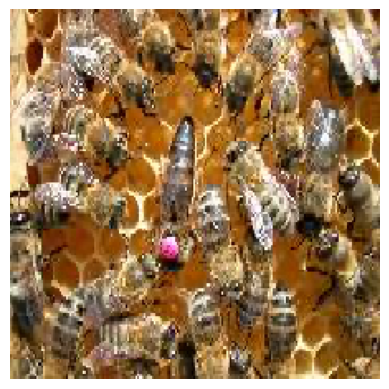

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.82999945]] probability.


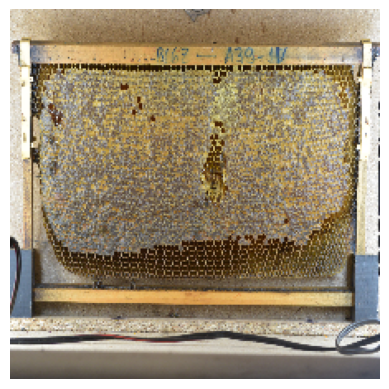

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.83033526]] probability.


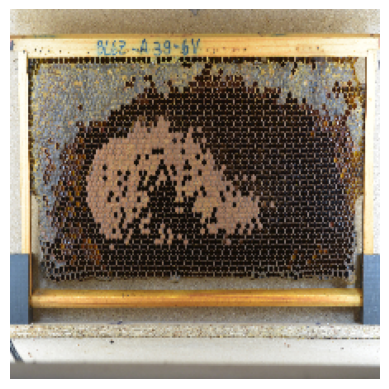

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.84144026]] probability.


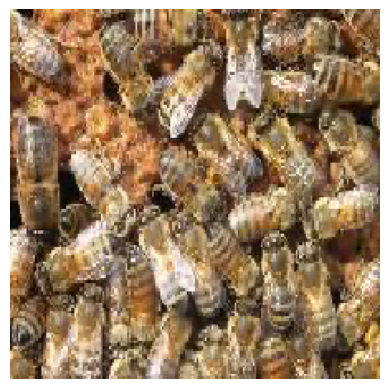

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.8602359]] probability.


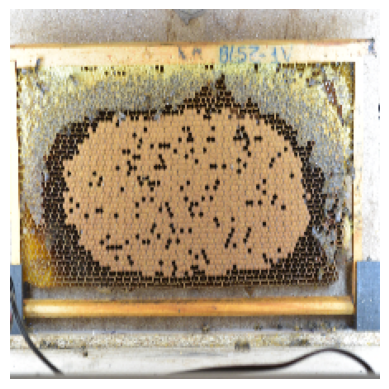

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.784049]] probability.


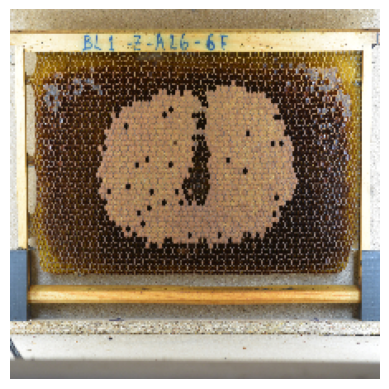

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.8620076]] probability.


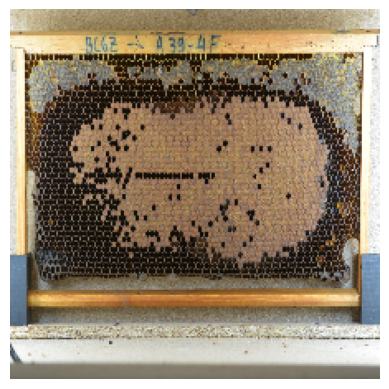

---------------------------------------------
1/1 [==============================] - 0s 11ms/step
This image is most likely HEALTHY with a [[0.8209402]] probability.


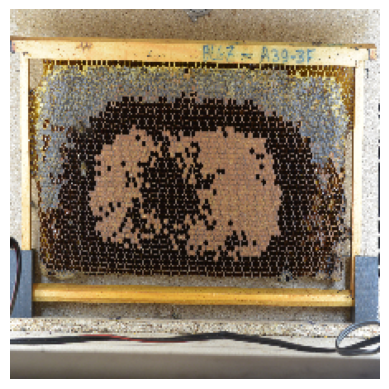

---------------------------------------------
1/1 [==============================] - 0s 9ms/step


The following encoder weights were not tied to the decoder ['vision_encoder_decoder/pooler', 'vision_encoder_decoder/embeddings', 'vision_encoder_decoder/layernorm', 'vision_encoder_decoder/encoder']


(('This image is likely diseased and may have afb with a 29.96 percent confidence.', <matplotlib.image.AxesImage object at 0x290d21f40>), [{'generated_text': 'bee open brood cell capping'}])


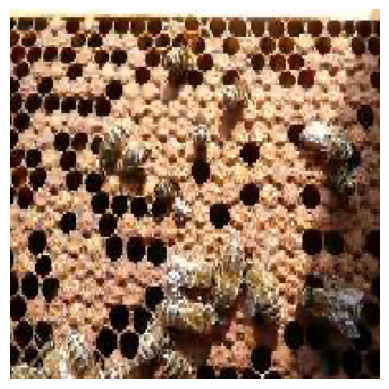

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.8250779]] probability.


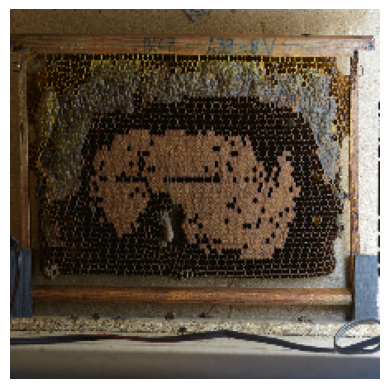

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.78163314]] probability.


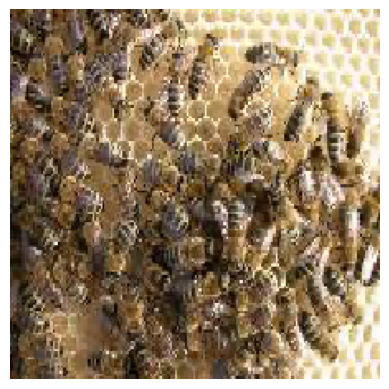

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.5874343]] probability.


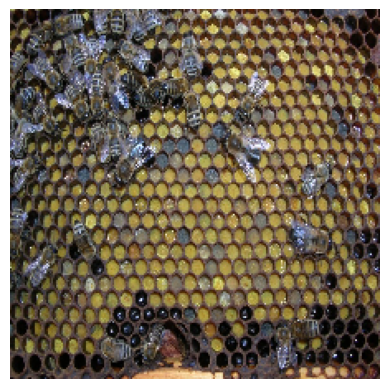

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.7836095]] probability.


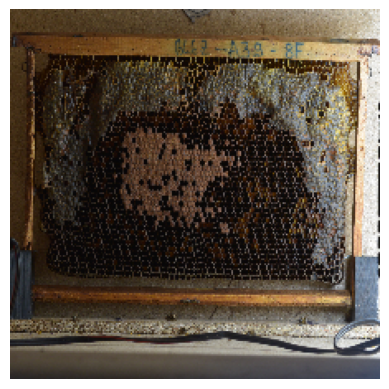

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.82916486]] probability.


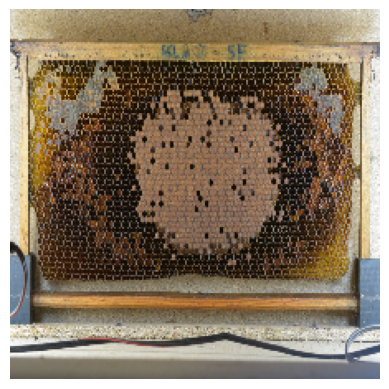

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.79056025]] probability.


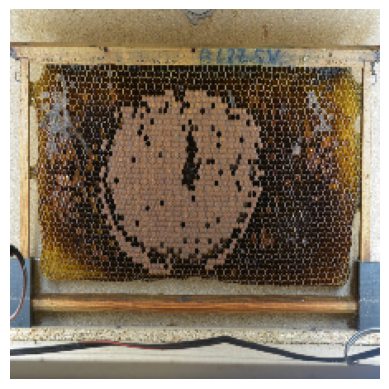

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.85453165]] probability.


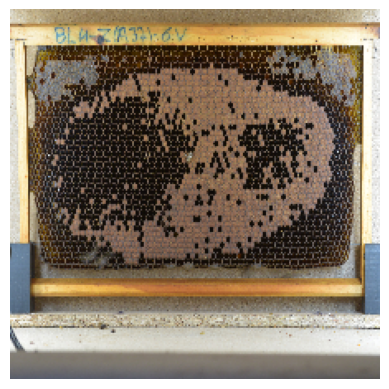

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.8045703]] probability.


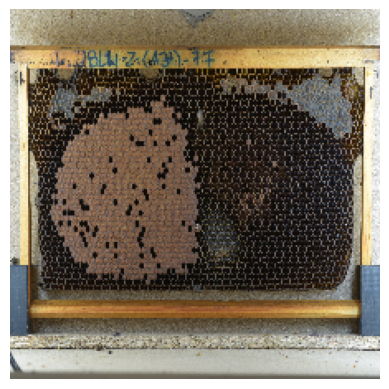

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.84345794]] probability.


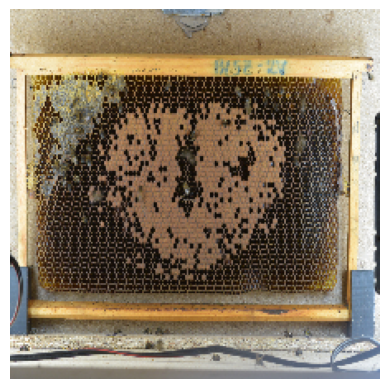

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.82466376]] probability.


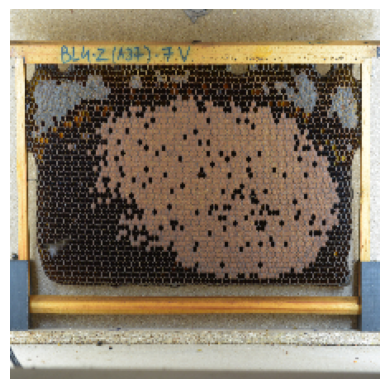

---------------------------------------------
1/1 [==============================] - 0s 10ms/step
This image is most likely HEALTHY with a [[0.84400016]] probability.


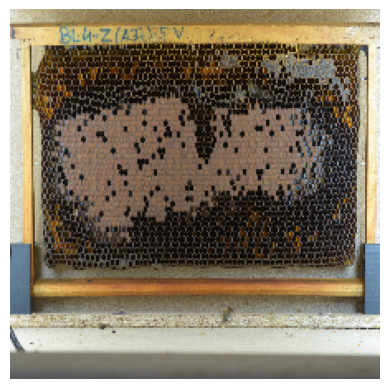

---------------------------------------------
1/1 [==============================] - 0s 11ms/step
This image is most likely HEALTHY with a [[0.84824044]] probability.


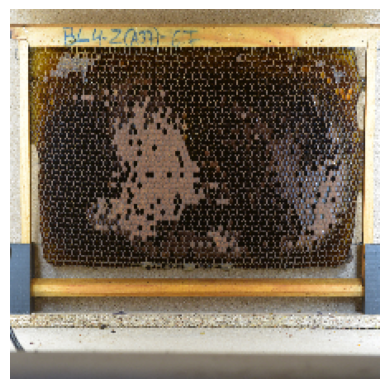

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.838021]] probability.


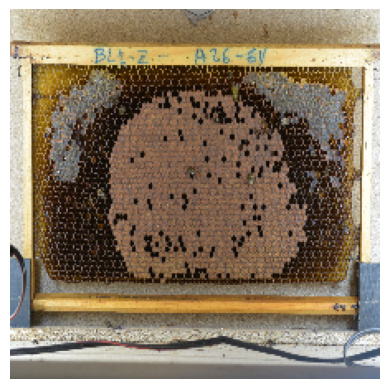

---------------------------------------------
1/1 [==============================] - 0s 9ms/step
This image is most likely HEALTHY with a [[0.8016866]] probability.


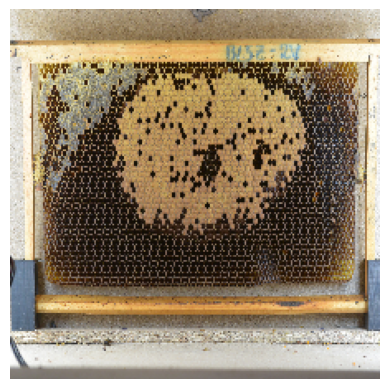

---------------------------------------------


In [13]:
import os
from os import listdir

folder = "BEES_TEST/Healthy"

for image in os.listdir(folder):
    if (image.endswith(".png")):
        image_path = folder + "/" + image
        print(Captioner(image_path))
        plt.axis("off")
        plt.show()
        print("---------------------------------------------")